In [1]:
# Convert COCO to YOLO

import logging
logging.getLogger().setLevel(logging.CRITICAL)
from pylabel import importer

import os 
import pandas as pd
import shutil
from tqdm import tqdm


In [3]:
#Download sample  dataset 
os.makedirs("data", exist_ok=True)
# !wget "https://github.com/pylabelalpha/notebook/blob/main/BCCD_coco.zip?raw=true" -O data/BCCD_coco.zip
# with zipfile.ZipFile("data/BCCD_coco.zip", 'r') as zip_ref:
#    zip_ref.extractall("data")

#Specify path to the coco.json file
#path_to_annotations = '/Users/caraappel/Documents/CV4E/oregon_critters/json/adj_xy/dataset_300_split_adjXY.json'
path_to_annotations = '/home/cara/oregon_critters/json/dataset_ground_620_adjxy_train.json'

#Specify the path to the images (if they are in a different folder than the annotations)
#path_to_images = "/Users/caraappel/Documents/CV4E/"
path_to_images = '/home/cara/oregon_critters/'

#Import the dataset into the pylable schema 
dataset = importer.ImportCoco(path_to_annotations, path_to_images=path_to_images)
dataset.df.head(5)

,img_folder,img_filename,img_path,img_id,img_width,img_height,img_depth,ann_segmented,ann_bbox_xmin,ann_bbox_ymin,...,ann_iscrowd,ann_keypoints,ann_pose,ann_truncated,ann_difficult,cat_id,cat_name,cat_supercategory,split,annotated
id,,,,,,,,,,,,,,,,,,,,,
0,/home/cara/oregon_critters/,data/COA_2021/CanadaJay_1AM/images/21911-2__21...,,1,1920,1440,,,278.069355,626.086957,...,0,,,,,1,CanadaJay,object,,1
1,/home/cara/oregon_critters/,data/COA_2021/CanadaJay_1AM/images/21911-2__21...,,2,1920,1440,,,280.025223,616.304348,...,0,,,,,1,CanadaJay,object,,1
2,/home/cara/oregon_critters/,data/COA_2021/CanadaJay_1AM/images/21911-2__21...,,3,1920,1440,,,240.907872,608.478261,...,0,,,,,1,CanadaJay,object,,1
3,/home/cara/oregon_critters/,data/COA_2021/cappel_COA-COA_2021_Cougar_1_AM/...,,4,2048,1536,,,1122.765762,1187.478261,...,0,,,,,2,Cougar,object,,1
4,/home/cara/oregon_critters/,data/COA_2021/cappel_COA-COA_2021_Cougar_1_AM/...,,5,2048,1536,,,1070.609294,1106.086957,...,0,,,,,2,Cougar,object,,1


In [4]:
# Analyze annotations
print(f"Number of images: {dataset.analyze.num_images}")
print(f"Number of classes: {dataset.analyze.num_classes}")
print(f"Classes:{dataset.analyze.classes}")
print(f"Class counts:\n{dataset.analyze.class_counts}")
print(f"Path to annotations:\n{dataset.path_to_annotations}")

Number of images: 4261
Number of classes: 36
Classes:['CanadaJay', 'Cougar', 'Coyote', 'GraySquirrel', 'Grouse', 'Mink', 'MountainBeaver', 'MountainQuail', 'Opossum', 'PileatedWoodpecker', 'RooseveltElk', 'Chickadee', 'StripedSkunk', 'Warbler', 'Weasel', 'Woodpecker', 'Human', 'FlyingSquirrel', 'AmericanRobin', 'BlackBear', 'BlackTailedDeer', 'Bobcat', 'DarkEyedJunco', 'NorthernFlicker', 'Rabbit', 'SpottedSkunk', 'VariedThrush', 'StellersJay', 'Woodrat', 'Wren', 'DouglasSquirrel', 'SmallMammal', 'Thrush', 'TownsendsChipmunk', 'GroundSquirrel', 'Herp']
Class counts:
cat_name
Thrush                516
SmallMammal           453
TownsendsChipmunk     406
FlyingSquirrel        385
VariedThrush          380
DouglasSquirrel       377
Rabbit                367
DarkEyedJunco         216
Woodrat               211
Wren                  130
BlackTailedDeer       123
BlackBear             104
AmericanRobin         102
StellersJay            79
GroundSquirrel         70
SpottedSkunk           66
Her

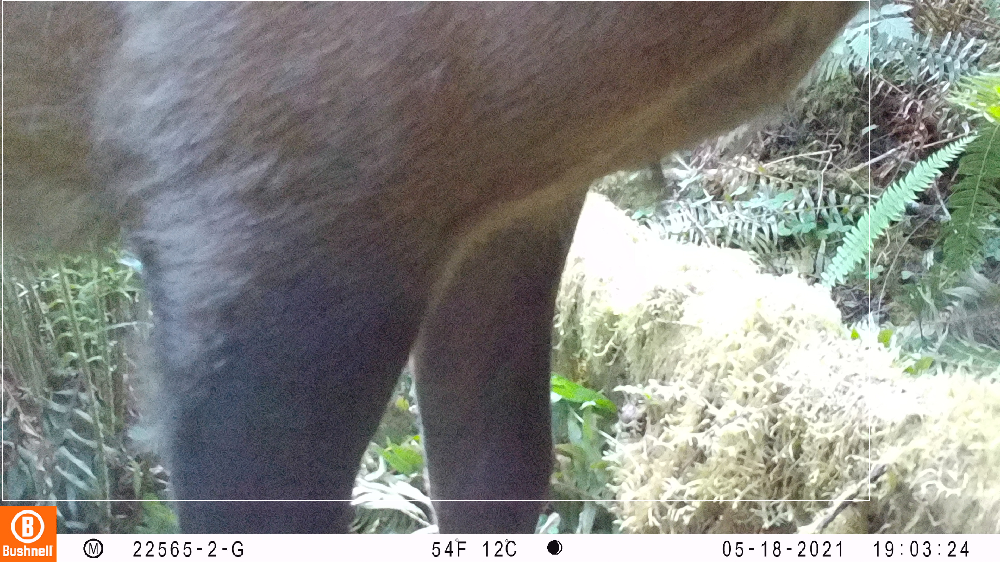

In [5]:
# Visualize annotations

from IPython.display import Image, display
display(dataset.visualize.ShowBoundingBoxes(100))
#display(dataset.visualize.ShowBoundingBoxes("BloodImage_00315.jpg"))

In [17]:
# Export to YOLOv5 format

dataset.path_to_annotations = ""

print(path_to_annotations)
#txt_output = os.path('')

dataset.export.ExportToYoloV5(output_path='/mnt/ssd-cluster/cara/',
                              yaml_file='cara/data/dataset.yaml',
                              copy_images=False,
                              cat_id_index=0)[0]

/home/cara/oregon_critters/dataset_300_split_adjXY.json


'/mnt/ssd-cluster/cara/data/dataset.yaml'